## Setup

In [3]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from skimage.morphology import h_minima

## Data loading

In [4]:
#loading the four AHN tiles from final_choice/ and mosaicing them into one elevation array.
path = r"final_choice/"

tif_lefttop = path + r"R5_44BN1.TIF"
tif_righttop = path + r"R5_44BN2.TIF"
tif_leftbottom = path + r"R5_44BZ1.TIF"
tif_rightbottom = path + r"R5_44BZ2.TIF"

with rasterio.open(tif_lefttop) as src_lt, rasterio.open(tif_righttop) as src_rt, rasterio.open(tif_leftbottom) as src_lb, rasterio.open(tif_rightbottom) as src_rb:
    left_top = src_lt.read(1, masked=True).astype(float).filled(np.nan)
    right_top = src_rt.read(1, masked=True).astype(float).filled(np.nan)
    left_bottom = src_lb.read(1, masked=True).astype(float).filled(np.nan)
    right_bottom = src_rb.read(1, masked=True).astype(float).filled(np.nan)

    print("left_top shape:", left_top.shape)
    print("right_top shape:", right_top.shape)
    print("left_bottom shape:", left_bottom.shape)
    print("right_bottom shape:", right_bottom.shape)

    elevation = np.block([[left_top, right_top], [left_bottom, right_bottom]])
    elevation[~np.isfinite(elevation)] = np.nan

    print("Merged array shape:", elevation.shape)
    print("Height / rows:", elevation.shape[0])
    print("Width / columns:", elevation.shape[1])
    print("Number of bands:", src_lt.count)
    print("Resolution:", src_lt.res)
    print("Bounds:", src_lt.bounds)
    print("CRS:", src_lt.crs)

print("Min:", np.nanmin(elevation))
print("Max:", np.nanmax(elevation))
print("Mean:", np.nanmean(elevation))
print("Total number of pixels:", elevation.size)

left_top shape: (1250, 1000)
right_top shape: (1250, 1000)
left_bottom shape: (1250, 1000)
right_bottom shape: (1250, 1000)
Merged array shape: (2500, 2000)
Height / rows: 2500
Width / columns: 2000
Number of bands: 1
Resolution: (5.0, 5.0)
Bounds: BoundingBox(left=110000.0, bottom=418750.0, right=115000.0, top=425000.0)
CRS: EPSG:28992
Min: -3.4235808849334717
Max: 119.20974731445312
Mean: 2.0693964136580254
Total number of pixels: 5000000


## Exploratory analysis

In [5]:
#count pixels per 10 m elevation interval to inspect the distribution.
interval_size = 10 #elevation intervals
intervals = np.arange(-10, 90 + interval_size, interval_size) 

valid = elevation[np.isfinite(elevation)]
hist, bin_edges = np.histogram(valid, bins=intervals)

print("Elevation intervals:")
for i in range(len(hist)):
    if hist[i] > 0:
        print(f"Interval {intervals[i]} - {intervals[i+1]}: {hist[i]} pixels")

Elevation intervals:
Interval -10 - 0: 298264 pixels
Interval 0 - 10: 3179346 pixels
Interval 10 - 20: 82282 pixels
Interval 20 - 30: 2441 pixels
Interval 30 - 40: 905 pixels
Interval 40 - 50: 207 pixels
Interval 50 - 60: 168 pixels
Interval 60 - 70: 159 pixels
Interval 70 - 80: 75 pixels
Interval 80 - 90: 114 pixels


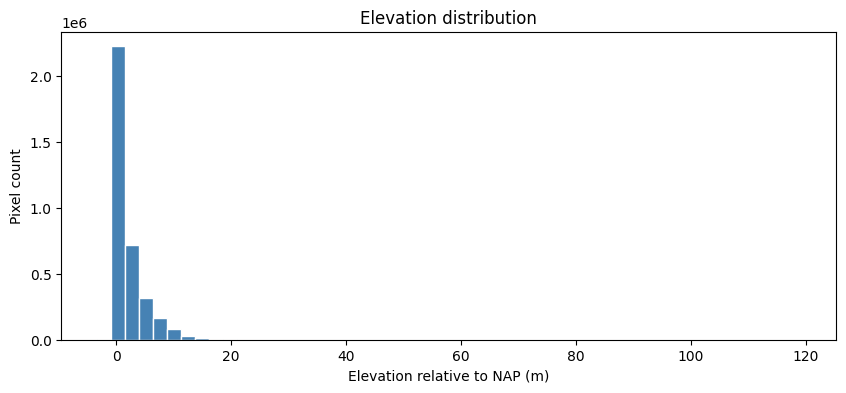

In [6]:
plt.figure(figsize=(10, 4))
plt.hist(valid, bins=50, color="steelblue", edgecolor="white")
plt.title("Elevation distribution")
plt.xlabel("Elevation relative to NAP (m)")
plt.ylabel("Pixel count")
plt.show() #distribution of elevation values in the whole tif file data.

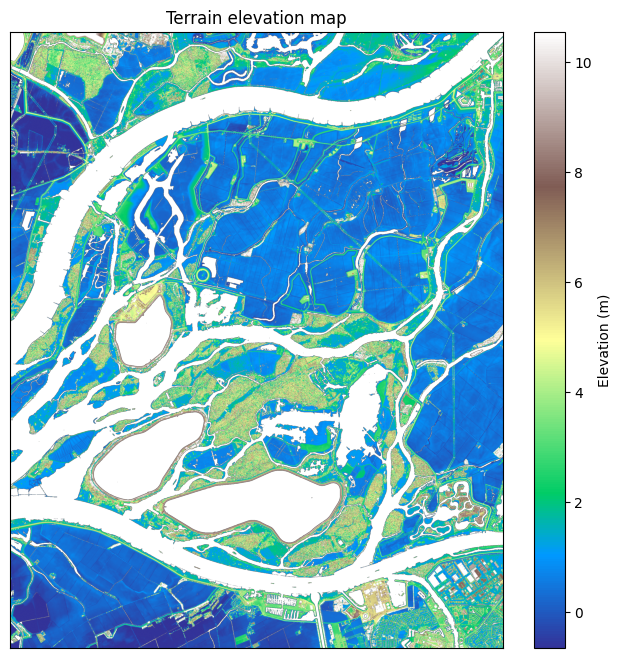

In [7]:
crop = elevation #use the full mosaic as the working region.
vmin_crop, vmax_crop = np.nanpercentile(crop, [2, 98])

plt.figure(figsize=(8, 8)) #visualization of the elevation data as a terrain map.
plt.imshow(crop, cmap="terrain", vmin=vmin_crop, vmax=vmax_crop)
plt.colorbar(label="Elevation (m)")
plt.title("Terrain elevation map")
plt.xticks([])
plt.yticks([])
plt.show()

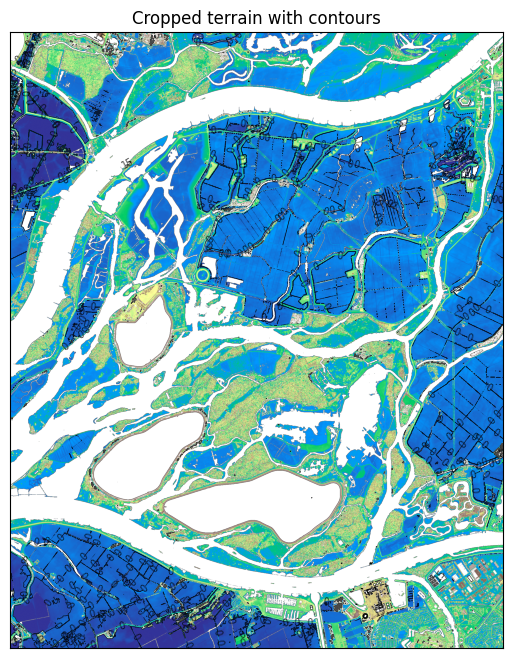

In [8]:
plt.figure(figsize=(8, 8)) #visualization of the cropped elevation data as a terrain map with contours.
vmin_crop, vmax_crop = np.nanpercentile(crop, [2, 98])

plt.imshow(crop, cmap="terrain", vmin=vmin_crop, vmax=vmax_crop)
contours = plt.contour(crop, levels=10, colors="black", linewidths=0.5, alpha=0.7) #adding black contour lines to the terrain map (also shows trees well)
plt.clabel(contours, inline=True, fontsize=7)
plt.title("Cropped terrain with contours")
plt.xticks([])
plt.yticks([])
plt.show()

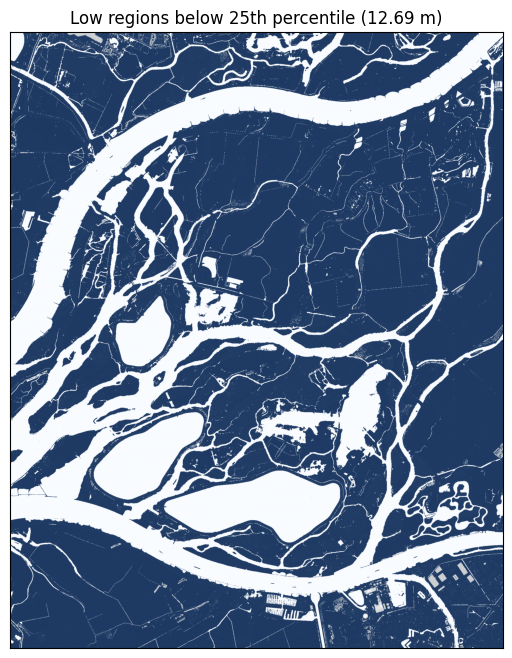

In [9]:
low_threshold = np.nanpercentile(crop, 99) #is 25th percentile a good threshold for low elevation?
low_regions = (crop <= low_threshold)

plt.figure(figsize=(8, 8)) #visualization of the low elevation regions in the cropped area (below 25th percentile).
plt.imshow(crop, cmap="Greys_r", alpha=0.7)
plt.imshow(low_regions, cmap="Blues", alpha=0.7)
plt.title(f"Low regions below 25th percentile ({low_threshold:.2f} m)")
plt.xticks([])
plt.yticks([])
plt.show()

## Data preparation for TDA

Seed pixels (NaN or < 0 m NAP): 1,734,184  (34.68% of crop)
  of which NaN:        1,435,920
  of which < 0 m NAP:  298,264


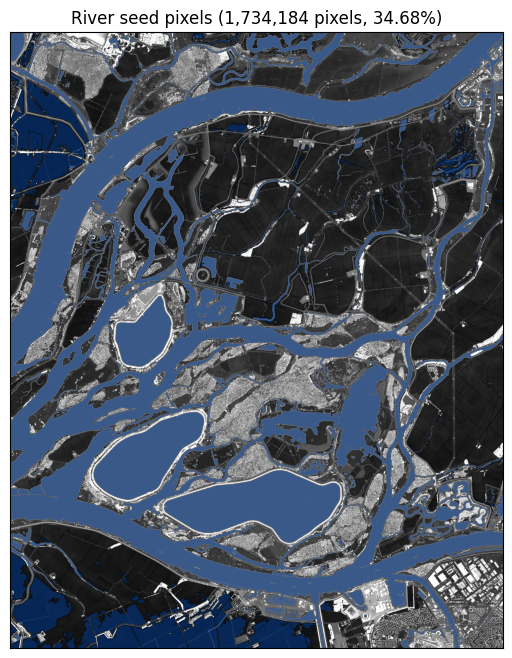

In [10]:
# --- 1. SEED IDENTIFICATION ---
#seeds here are NaN pixels (water bodies) + pixels below 0 m NAP (below sea level)
nan_mask = ~np.isfinite(crop)
below_zero_mask = np.isfinite(crop) & (crop < 0.0)
seed_mask_full = nan_mask | below_zero_mask

n_seeds = seed_mask_full.sum()
total_pixels = seed_mask_full.size
print(f"Seed pixels (NaN or < 0 m NAP): {n_seeds:,}  ({100 * n_seeds / total_pixels:.2f}% of crop)")
print(f"  of which NaN:        {nan_mask.sum():,}")
print(f"  of which < 0 m NAP:  {below_zero_mask.sum():,}")

fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(crop, cmap="Greys_r", vmin=vmin_crop, vmax=vmax_crop) #hues of grey for elevation
seed_overlay = np.where(seed_mask_full, 1.0, np.nan)
ax.imshow(seed_overlay, cmap="Blues", vmin=0, vmax=1, alpha=0.8) #make seed pixels blue
ax.set_title(f"River seed pixels ({n_seeds:,} pixels, {100 * n_seeds / total_pixels:.2f}%)")
ax.set_xticks([])
ax.set_yticks([])
plt.show()

In [11]:
# --- 2. BARRIER FILL ---
#replace NaN with max_elevation + 1 so NaN cells act as impassable walls in the topological analysis (they sit above any meaningful water level).
barrier_value = np.nanmax(crop) + 1.0
crop_tda = crop.copy()
crop_tda[nan_mask] = barrier_value

print(f"crop_tda — no NaN: {not np.any(np.isnan(crop_tda))}")
print(f"  min:     {np.min(crop_tda):.4f} m")
print(f"  max:     {np.max(crop_tda):.4f} m  (barrier value = {barrier_value:.4f} m)")
print(f"  mean:    {np.mean(crop_tda):.4f} m")
print(f"  barrier pixels: {(crop_tda == barrier_value).sum():,}")

crop_tda — no NaN: True
  min:     -3.4236 m
  max:     120.2097 m  (barrier value = 120.2097 m)
  mean:    35.9974 m
  barrier pixels: 1,435,920


Seed pixels form 8094 connected component(s)

Bounding boxes of all 8094 component(s):


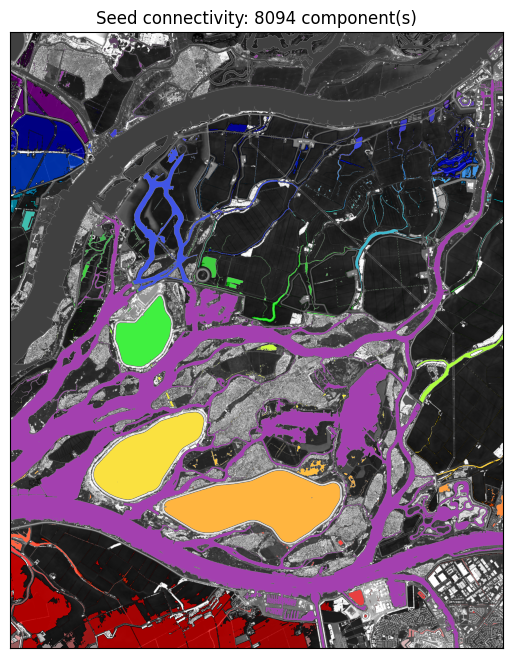

In [12]:
# --- 3. CONNECTIVITY CHECK ---
from scipy.ndimage import label, find_objects

structure = np.ones((3, 3), dtype=int)  # 8-connectivity
labeled_seeds, n_components = label(seed_mask_full, structure=structure)
print(f"Seed pixels form {n_components} connected component(s)")

slices = find_objects(labeled_seeds)
print(f"\nBounding boxes of all {n_components} component(s):")
for i, sl in enumerate(slices):
    row_sl, col_sl = sl
    height = row_sl.stop - row_sl.start
    width  = col_sl.stop - col_sl.start
    size   = (labeled_seeds == i + 1).sum()
    # print(f"  Component {i+1:3d}: rows [{row_sl.start:5d}–{row_sl.stop:5d}]  "
    #       f"cols [{col_sl.start:5d}–{col_sl.stop:5d}]  "
    #       f"({height}×{width} bbox, {size:,} seed pixels)")

fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(crop, cmap="Greys_r", vmin=vmin_crop, vmax=vmax_crop)
component_overlay = labeled_seeds.astype(float)
component_overlay[component_overlay == 0] = np.nan
ax.imshow(component_overlay, cmap="tab10" if n_components <= 10 else "nipy_spectral", alpha=0.75)
ax.set_title(f"Seed connectivity: {n_components} component(s)")
ax.set_xticks([])
ax.set_yticks([])
plt.show()

## Persistence analysis (GUDHI)

### Persistence analysis — GUDHI CubicalComplex
Computes the sublevel set persistent homology of the terrain grid.
Each H0 persistence pair (birth, death) corresponds to one basin:
birth = elevation of the local minimum, death = elevation of the
saddle at which it merges with a lower basin. Persistence = death - birth
measures basin depth and is used to filter LiDAR noise.
**Feeds into:** RQ3 (saddle elevations), RQ4 (saddle locations).

In [13]:
#create the cubical complex from crop_tda (no NaN, barriers as max+1).
try:
    import gudhi
except ImportError:
    import subprocess, sys
    subprocess.check_call([sys.executable, "-m", "pip", "install", "gudhi"])
    import gudhi

cc = gudhi.CubicalComplex(
    dimensions=list(crop_tda.shape),
    top_dimensional_cells=crop_tda.flatten()
)
print(f"CubicalComplex created.")
print(f"  Grid shape: {crop_tda.shape}  ({crop_tda.size:,} pixels)")
print(f"  Simplices:  {cc.num_simplices():,}")
print(f"  Dimension:  {cc.dimension()}")

CubicalComplex created.
  Grid shape: (2500, 2000)  (5,000,000 pixels)
  Simplices:  20,009,001
  Dimension:  2


In [14]:
#compute sublevel set persistence. H0 pairs = (birth, death) = (basin min elevation, saddle elevation).
diag = cc.persistence()

# Filter to finite H0 pairs with real saddles (exclude the infinite bar and barrier-wall deaths).
h0_pairs = [
    (b, d)
    for dim, (b, d) in diag
    if dim == 0 and d != float('inf') and d < barrier_value
]

gudhi_births       = np.array([b for b, d in h0_pairs])
gudhi_deaths       = np.array([d for b, d in h0_pairs])
gudhi_persistences = gudhi_deaths - gudhi_births
persistence_pairs  = np.column_stack([gudhi_births, gudhi_deaths])   # shape (N, 2)

n_inf     = sum(1 for dim, (b, d) in diag if dim == 0 and d == float('inf'))
n_barrier = sum(1 for dim, (b, d) in diag if dim == 0 and d != float('inf') and d >= barrier_value)
print(f"H0 finite basins (real saddles):  {len(h0_pairs):,}")
print(f"H0 infinite bar (global minimum): {n_inf}")
print(f"Basins stopped by barrier walls:  {n_barrier}")
print(f"Persistence  min:  {gudhi_persistences.min():.4f} m")
print(f"Persistence  max:  {gudhi_persistences.max():.4f} m")
print(f"Persistence mean:  {gudhi_persistences.mean():.4f} m")

H0 finite basins (real saddles):  320,528
H0 infinite bar (global minimum): 1
Basins stopped by barrier walls:  2437
Persistence  min:  0.0000 m
Persistence  max:  25.0638 m
Persistence mean:  0.6383 m


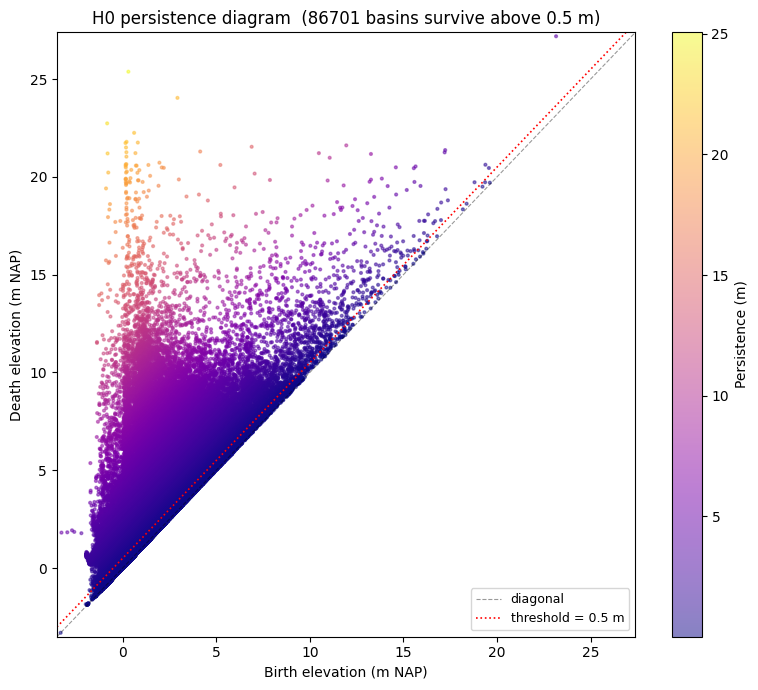

Basins above threshold: 86701


In [15]:
#persistence diagram: each point is a basin, distance above diagonal = basin depth (persistence).
persistence_threshold = 0.5   # metres — change this to adjust the noise filter

fig, ax = plt.subplots(figsize=(8, 7))
sc = ax.scatter(gudhi_births, gudhi_deaths, c=gudhi_persistences, cmap='plasma', s=4, alpha=0.5)
plt.colorbar(sc, ax=ax, label='Persistence (m)')

lo = min(gudhi_births.min(), gudhi_deaths.min()) - 0.2
hi = gudhi_deaths.max() + 0.2
ax.plot([lo, hi], [lo, hi], 'k--', linewidth=0.8, alpha=0.4, label='diagonal')
ax.plot([lo, hi], [lo + persistence_threshold, hi + persistence_threshold],
        'r:', linewidth=1.2, label=f'threshold = {persistence_threshold} m')

n_above = (gudhi_persistences >= persistence_threshold).sum()
ax.set_xlim(lo, hi)
ax.set_ylim(lo, hi)
ax.set_xlabel('Birth elevation (m NAP)')
ax.set_ylabel('Death elevation (m NAP)')
ax.set_title(f'H0 persistence diagram  ({n_above} basins survive above {persistence_threshold} m)')
ax.legend(fontsize=9)
plt.tight_layout()
plt.show()
print(f"Basins above threshold: {n_above}")

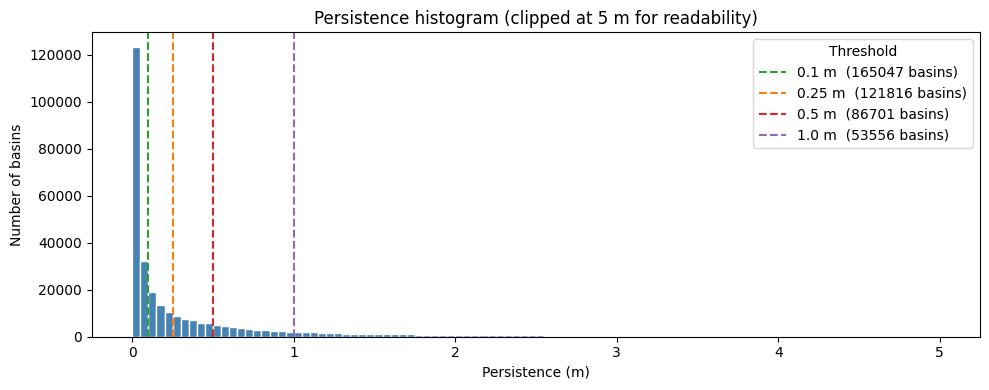

In [16]:
#persistence histogram to help choose a noise-filtering threshold.
fig, ax = plt.subplots(figsize=(10, 4))
ax.hist(gudhi_persistences[gudhi_persistences < 5], bins=100, color='steelblue', edgecolor='white')

for thresh, color in [(0.1, '#2ca02c'), (0.25, '#ff7f0e'), (0.5, '#d62728'), (1.0, '#9467bd')]:
    n = (gudhi_persistences >= thresh).sum()
    ax.axvline(thresh, color=color, linewidth=1.5, linestyle='--', label=f'{thresh} m  ({n} basins)')

ax.set_xlabel('Persistence (m)')
ax.set_ylabel('Number of basins')
ax.set_title('Persistence histogram (clipped at 5 m for readability)')
ax.legend(title='Threshold')
plt.tight_layout()
plt.show()

In [17]:
#find basin minimum and saddle pixel locations by matching birth/death elevations in crop_tda.
# GUDHI birth/death values are exact pixel elevations from the input array, so value-matching is exact.
flat = crop_tda.flatten()

basin_locations  = []
saddle_locations = []
filtered_pairs   = []

for b, d in h0_pairs:
    if (d - b) < persistence_threshold:
        continue

    # Basin: the pixel whose elevation equals the birth value is the local minimum.
    birth_matches = np.where(flat == b)[0]
    if len(birth_matches) == 0:
        birth_matches = np.array([np.argmin(np.abs(flat - b))])  # float-safe fallback
    basin_r, basin_c = np.unravel_index(birth_matches[0], crop_tda.shape)
    basin_locations.append((basin_r, basin_c))

    # Saddle: pixel at death elevation closest to the basin minimum.
    death_matches = np.where(flat == d)[0]
    if len(death_matches) == 0:
        death_matches = np.array([np.argmin(np.abs(flat - d))])
    if len(death_matches) == 1:
        saddle_r, saddle_c = np.unravel_index(death_matches[0], crop_tda.shape)
    else:
        dists = (np.abs(death_matches // crop_tda.shape[1] - basin_r) +
                 np.abs(death_matches %  crop_tda.shape[1] - basin_c))
        saddle_r, saddle_c = np.unravel_index(death_matches[np.argmin(dists)], crop_tda.shape)
    saddle_locations.append((saddle_r, saddle_c))

    filtered_pairs.append((b, d))

print(f"Basins above {persistence_threshold} m threshold: {len(basin_locations)}")
print(f"Saddle points identified:                  {len(saddle_locations)}")

Basins above 0.5 m threshold: 86701
Saddle points identified:                  86701


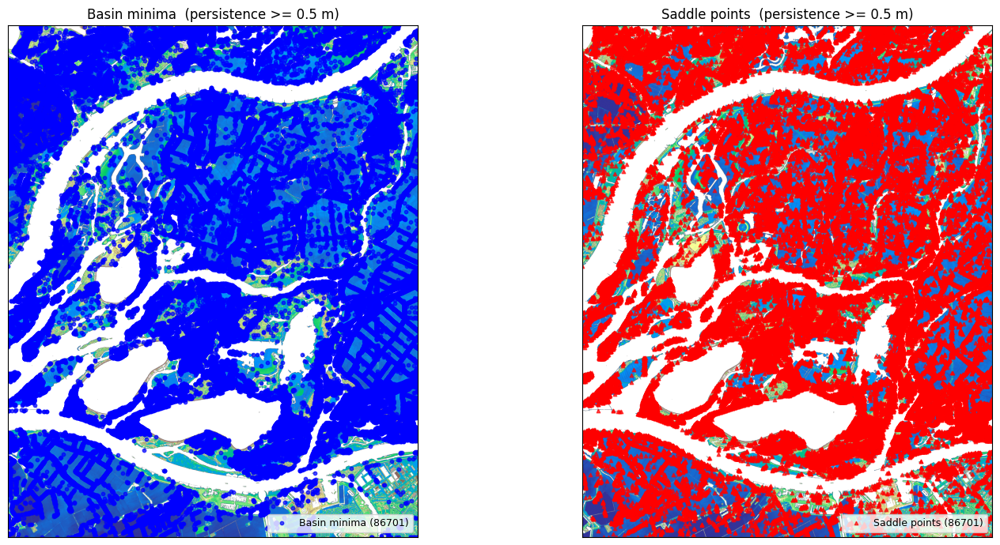

In [18]:
#plot basin minima and saddle points on the terrain map.
basin_arr  = np.array(basin_locations)
saddle_arr = np.array(saddle_locations)

fig, axes = plt.subplots(1, 2, figsize=(16, 7))
for ax in axes:
    ax.imshow(crop, cmap='terrain', vmin=vmin_crop, vmax=vmax_crop)
    ax.set_xticks([])
    ax.set_yticks([])

axes[0].scatter(basin_arr[:, 1], basin_arr[:, 0],
                c='blue', s=10, alpha=0.7, label=f'Basin minima ({len(basin_arr)})')
axes[0].set_title(f'Basin minima  (persistence >= {persistence_threshold} m)')
axes[0].legend(fontsize=9)

axes[1].scatter(saddle_arr[:, 1], saddle_arr[:, 0],
                c='red', s=10, marker='^', alpha=0.7, label=f'Saddle points ({len(saddle_arr)})')
axes[1].set_title(f'Saddle points  (persistence >= {persistence_threshold} m)')
axes[1].legend(fontsize=9)

plt.tight_layout()
plt.show()

## Merge tree via sublevel set sweep

### Merge tree — union-find sublevel set sweep
Implements the Morse theory merge tree algorithm from scratch using
scipy DisjointSet. Pixels are processed in ascending elevation order;
new connected components are born at local minima and merged at saddle
points. Produces the same birth/death structure as GUDHI but makes the
algorithm explicit and produces a tree that can be visualised as a
dendrogram. Run at 20m resolution for speed.
**Answers:** RQ3 (at which elevations do components merge?).
Note: GUDHI (5m) and this sweep (20m) both compute persistence pairs —
GUDHI is used for accurate saddle locations, this sweep for the tree structure.

In [19]:
from scipy.cluster.hierarchy import DisjointSet

def compute_merge_tree(Z):
    """
    Build the merge tree of Z via a sublevel set sweep using union-find.

    Algorithm (lower-star filtration, Morse theory):
      1. Sort all pixels by elevation (ascending).
      2. For each pixel p (in order):
           a. Mark p as processed.
           b. Collect the distinct component roots of already-processed 8-neighbors.
           c. No processed neighbors -> p is a LOCAL MINIMUM: birth a new component,
              record (elevation, row, col).
           d. Otherwise -> p is a SADDLE or slope pixel: merge all neighbor components.
              For each pair of distinct roots: record a MERGE EVENT
              (saddle_elevation, birth_elev_A, birth_elev_B).
      3. The birth elevation of the surviving component after a merge is the minimum
         birth elevation among all merged components (elder rule).

    Z: 2D float array (no NaN), shape (rows, cols).
    Returns: births (list of (elev, r, c)),
             merges (list of (saddle_elev, birth_A, birth_B)),
             ds (DisjointSet over pixel indices).
    """
    rows, cols = Z.shape
    flat = Z.flatten()
    order = np.argsort(flat, kind='stable')   # process pixels low to high

    ds = DisjointSet(range(rows * cols))
    processed  = np.zeros(rows * cols, dtype=bool)
    birth_elev = np.full(rows * cols, np.nan)  # birth elevation of each component root

    births = []   # (elevation, row, col)
    merges = []   # (saddle_elevation, birth_A, birth_B)

    for idx in order:
        r, c = divmod(idx, cols)
        processed[idx] = True

        # roots of already-processed 8-neighbors
        nbr_roots = set()
        for dr, dc in [(-1,0),(1,0),(0,-1),(0,1),(-1,-1),(-1,1),(1,-1),(1,1)]:
            nr, nc = r + dr, c + dc
            if 0 <= nr < rows and 0 <= nc < cols and processed[nr * cols + nc]:
                nbr_roots.add(ds[nr * cols + nc])

        if not nbr_roots:
            # local minimum: birth a new component at this pixel
            birth_elev[idx] = flat[idx]
            births.append((float(flat[idx]), r, c))
        else:
            roots = list(nbr_roots)
            # merge neighbor components pairwise, recording each merge event
            for i in range(1, len(roots)):
                rp = ds[roots[0]]
                ro = ds[roots[i]]
                if rp != ro:
                    merges.append((float(flat[idx]),
                                   float(birth_elev[rp]),
                                   float(birth_elev[ro])))
                    ds.merge(rp, ro)
                    new_root = ds[rp]
                    birth_elev[new_root] = float(np.nanmin([birth_elev[rp], birth_elev[ro]]))

            # save oldest birth before merging current pixel in
            # (ds.merge may promote idx to root, overwriting birth_elev[idx])
            merged_birth = float(np.nanmin([birth_elev[ds[root]] for root in roots]))
            ds.merge(idx, roots[0])
            birth_elev[ds[idx]] = merged_birth

    return births, merges, ds

Grid: (2500, 2000)  (5,000,000 pixels)
Done in 149.2 s

Local minima (births):       190,334
Total merge events:          190,333
Valid merge events (< 120 m): 189,700

Merge elevation distribution:
  10th percentile: 0.03 m NAP
  25th percentile: 0.41 m NAP
  50th percentile: 1.15 m NAP
  75th percentile: 2.62 m NAP
  90th percentile: 4.49 m NAP


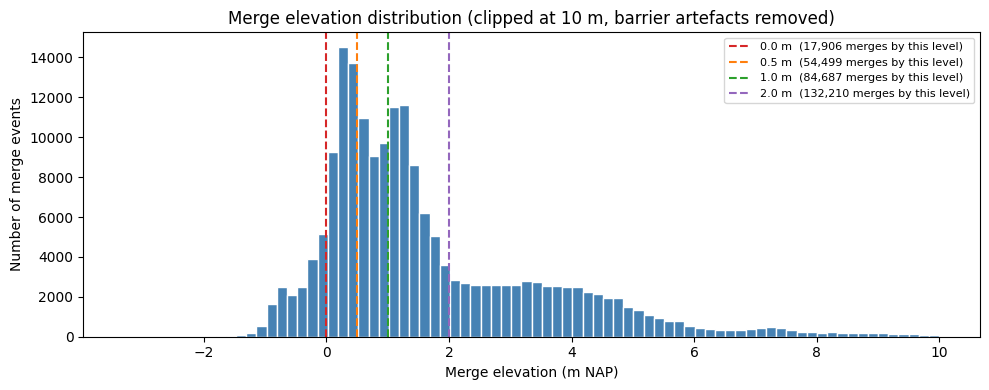

In [20]:
#run the merge tree sweep. runtime depends on resolution — full crop_tda may take several minutes.
import time

#Z_sweep = crop_tda[::4, ::4]   # 20 m resolution (~5 s)
#Z_sweep = crop_tda[::2, ::2]   # 10 m resolution (~30 s)
Z_sweep = crop_tda               # full 5 m resolution
print(f"Grid: {Z_sweep.shape}  ({Z_sweep.size:,} pixels)")

t0 = time.time()
births, merges, _ = compute_merge_tree(Z_sweep)
print(f"Done in {time.time() - t0:.1f} s\n")

# Filter: remove merges with NaN birth elevations (barrier pixel artefacts)
# AND merges at or above barrier_value (sweep connected two barrier regions).
# valid_merges: barrier artefacts removed, used by all downstream cells
valid_merges = [
    (se, ba, bb) for se, ba, bb in merges
    if not (np.isnan(ba) or np.isnan(bb)) and se < barrier_value
]

print(f"Local minima (births):       {len(births):,}")
print(f"Total merge events:          {len(merges):,}")
print(f"Valid merge events (< 120 m): {len(valid_merges):,}")

merge_elevs = np.array([se for se, _, _ in valid_merges])
print(f"\nMerge elevation distribution:")
for p in [10, 25, 50, 75, 90]:
    print(f"  {p:2d}th percentile: {np.percentile(merge_elevs, p):.2f} m NAP")

fig, ax = plt.subplots(figsize=(10, 4))
clip = 10
ax.hist(merge_elevs[merge_elevs < clip], bins=80, color='steelblue', edgecolor='white')
for level, color in [(0.0,'#d62728'), (0.5,'#ff7f0e'), (1.0,'#2ca02c'), (2.0,'#9467bd')]:
    n = (merge_elevs <= level).sum()
    ax.axvline(level, color=color, linewidth=1.5, linestyle='--',
               label=f'{level} m  ({n:,} merges by this level)')
ax.set_xlabel('Merge elevation (m NAP)')
ax.set_ylabel('Number of merge events')
ax.set_title(f'Merge elevation distribution (clipped at {clip} m, barrier artefacts removed)')
ax.legend(fontsize=8)
plt.tight_layout()
plt.show()

Significant merges (persistence >= 0.5 m): 43725


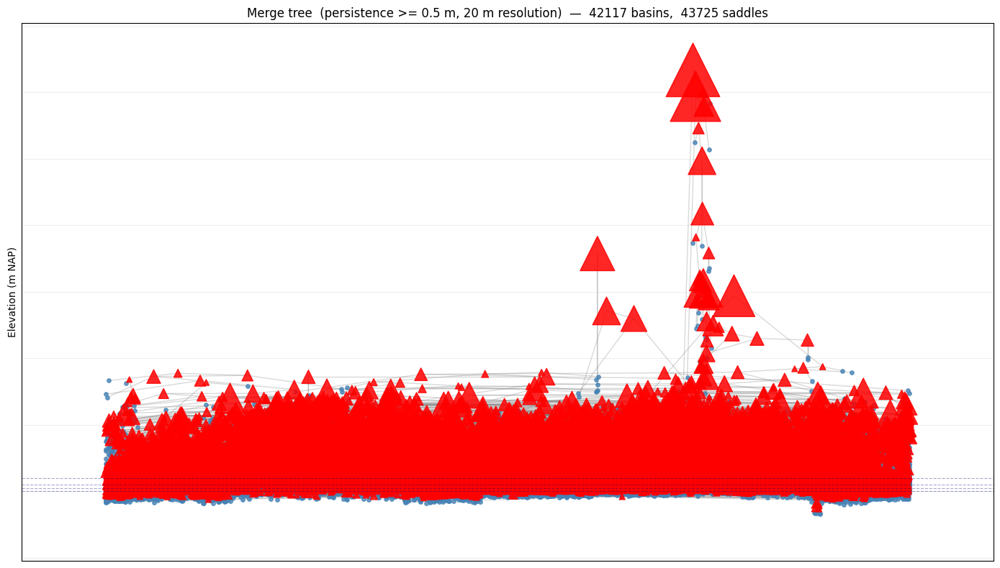

In [21]:
#build and draw the merge tree as a dendrogram using networkx. y-axis = elevation.
try:
    import networkx as nx
except ImportError:
    import subprocess, sys
    subprocess.check_call([sys.executable, "-m", "pip", "install", "networkx"])
    import networkx as nx

min_pers_tree = 0.5   # metres — only show merges above this persistence

# Elder rule: the younger component (higher birth) dies at the saddle.
# Persistence of a merge = saddle_elev - max(birth_A, birth_B).
sig_merges = [
    (se, ba, bb, se - max(ba, bb))
    for se, ba, bb in valid_merges
    if (se - max(ba, bb)) >= min_pers_tree
]
print(f"Significant merges (persistence >= {min_pers_tree} m): {len(sig_merges)}")

# Build a lookup from birth_elev -> birth pixel column (for x-layout).
births_map = {round(b, 5): (br, bc) for b, br, bc in births}

# Collect birth elevations referenced by significant merges.
referenced = set()
for se, ba, bb, _ in sig_merges:
    referenced.add(round(ba, 5))
    referenced.add(round(bb, 5))

# Build graph: leaf nodes = significant births, internal nodes = merge events.
G = nx.DiGraph()
birth_to_node = {}   # round(birth_elev, 5) -> current node ID in G

for i, (b, br, bc) in enumerate(births):
    key = round(b, 5)
    if key in referenced and key not in birth_to_node:
        nid = f"b{i}"
        G.add_node(nid, elev=b, kind='birth', col=bc)
        birth_to_node[key] = nid

for i, (se, ba, bb, pers) in enumerate(sig_merges):
    nid = f"m{i}"
    G.add_node(nid, elev=se, kind='merge', pers=pers)
    for bkey in [round(ba, 5), round(bb, 5)]:
        if bkey in birth_to_node:
            G.add_edge(birth_to_node[bkey], nid)
    # Elder (lower birth) survives and is now represented by this merge node.
    birth_to_node[round(min(ba, bb), 5)] = nid

# Layout: birth nodes x = pixel column; merge nodes x = mean of predecessors.
pos = {}
for nid, d in G.nodes(data=True):
    if d['kind'] == 'birth':
        pos[nid] = (d['col'], d['elev'])

for nid, d in G.nodes(data=True):
    if d['kind'] == 'merge':
        pred_xs = [pos[p][0] for p in G.predecessors(nid) if p in pos]
        pos[nid] = (float(np.mean(pred_xs)) if pred_xs else 0.0, d['elev'])

birth_nodes = [n for n, d in G.nodes(data=True) if d['kind'] == 'birth'  and n in pos]
merge_nodes = [n for n, d in G.nodes(data=True) if d['kind'] == 'merge'  and n in pos]
merge_sizes = [max(25, G.nodes[n]['pers'] * 60) for n in merge_nodes]

fig, ax = plt.subplots(figsize=(14, 8))
nx.draw_networkx_edges(G, pos, ax=ax, alpha=0.3, edge_color='grey', arrows=False)
nx.draw_networkx_nodes(G, pos, nodelist=birth_nodes, ax=ax,
                       node_color='steelblue', node_size=15, alpha=0.8)
nx.draw_networkx_nodes(G, pos, nodelist=merge_nodes, ax=ax,
                       node_color='red', node_size=merge_sizes,
                       node_shape='^', alpha=0.85)

for level in [0.0, 0.5, 1.0, 2.0]:
    ax.axhline(level, color='navy', lw=0.8, ls='--', alpha=0.35)

ax.set_ylabel('Elevation (m NAP)')
ax.set_xticks([])
ax.yaxis.grid(True, alpha=0.2)
ax.set_title(
    f'Merge tree  (persistence >= {min_pers_tree} m, 20 m resolution)'
    f'  —  {len(birth_nodes)} basins,  {len(merge_nodes)} saddles'
)
plt.tight_layout()
plt.show()

## Topological flood simulation (priority queue)

### Topological flood simulation
Simulates flooding from river seed pixels using a min-heap priority queue.
Each pixel's flood_level_map value is the BOTTLENECK elevation: the minimum
water level at which it becomes reachable from the river through connected
terrain. A pixel behind a 3m dike has bottleneck = 3m regardless of its
own elevation. This is the key difference from the simple threshold model.
**Answers:** RQ1 (threshold vs topological), RQ2 (which basins connect first).

In [22]:
import heapq
from scipy.ndimage import label as _label

def topological_flood(Z, seed_mask, original_Z, water_levels=None):
    """
    Priority-queue topological flood simulation.

    Each pixel's flood_level_map value is the BOTTLENECK elevation: the minimum
    water level at which the pixel becomes reachable from a seed through connected
    terrain. A pixel at -1m NAP behind a 3m dike has bottleneck = 3m, not -1m.
    This is the key difference from the simple threshold model.

    Z          : 2D elevation array (no NaN, barriers as max+1)
    seed_mask  : bool array, True where river seed pixels are
    original_Z : original elevation array with NaN for water bodies (used for
                 seed elevations so land pixels below 0m flood correctly)
    water_levels: water levels at which to record label snapshots
    Returns: flood_labels, flood_level_map, saddle_events, snapshots
    """
    rows, cols = Z.shape
    flood_labels    = np.full((rows, cols), -1, dtype=int)
    flood_level_map = np.full((rows, cols), np.nan)

    # Pre-cluster seed pixels into 8-connected components.
    labeled_seeds_init, n_seed_comps = _label(seed_mask, structure=np.ones((3, 3), dtype=int))
    label_counter = n_seed_comps

    for comp in range(1, n_seed_comps + 1):
        lbl = comp - 1
        mask = (labeled_seeds_init == comp)
        flood_labels[mask]    = lbl
        flood_level_map[mask] = Z[mask]

    parent = list(range(label_counter))

    def find(x):
        while parent[x] != x:
            parent[x] = parent[parent[x]]
            x = parent[x]
        return x

    def union(x, y):
        px, py = find(x), find(y)
        if px != py:
            parent[py] = px
            return True
        return False

    # Push boundary pixels with their bottleneck elevation.
    # Land seeds below 0m NAP use their real elevation; NaN water-body seeds
    # use the global minimum so they do not inflate the bottleneck for neighbours.
    _global_min = float(np.nanmin(original_Z))
    heap   = []
    pushed = np.zeros((rows, cols), dtype=bool)
    for r, c in np.argwhere(seed_mask):
        lbl = flood_labels[r, c]
        if np.isfinite(original_Z[r, c]):
            seed_e = float(original_Z[r, c])
        else:
            seed_e = _global_min
        for dr, dc in [(-1,0),(1,0),(0,-1),(0,1),(-1,-1),(-1,1),(1,-1),(1,1)]:
            nr, nc = r + dr, c + dc
            if 0 <= nr < rows and 0 <= nc < cols and flood_labels[nr, nc] < 0 and not pushed[nr, nc]:
                heapq.heappush(heap, (max(seed_e, float(Z[nr, nc])), nr, nc, lbl))
                pushed[nr, nc] = True

    if water_levels is None:
        valid = Z[Z < np.nanmax(Z)]
        water_levels = np.linspace(np.nanmin(valid), np.nanpercentile(valid, 80), 50)

    water_level_iter = iter(sorted(water_levels))
    next_snapshot    = next(water_level_iter, None)
    saddle_events    = []
    snapshots        = {}

    while heap:
        elev, r, c, src_label = heapq.heappop(heap)

        if flood_labels[r, c] >= 0:
            existing = find(flood_labels[r, c])
            incoming = find(src_label)
            if existing != incoming:
                saddle_events.append((elev, existing, incoming))
                union(existing, incoming)
            continue

        canonical_label       = find(src_label)
        flood_labels[r, c]    = canonical_label
        flood_level_map[r, c] = elev   # bottleneck, not raw pixel elevation

        while next_snapshot is not None and elev >= next_snapshot:
            snapshots[next_snapshot] = flood_labels.copy()
            next_snapshot = next(water_level_iter, None)

        # Bottleneck to each neighbour = max(current bottleneck, neighbour elevation).
        for dr, dc in [(-1,0),(1,0),(0,-1),(0,1),(-1,-1),(-1,1),(1,-1),(1,1)]:
            nr, nc = r + dr, c + dc
            if 0 <= nr < rows and 0 <= nc < cols and flood_labels[nr, nc] < 0:
                heapq.heappush(heap, (max(elev, float(Z[nr, nc])), nr, nc, canonical_label))

    return flood_labels, flood_level_map, saddle_events, snapshots

In [23]:
#run the topological flood simulation on crop_tda with the river seed pixels.
import time

water_levels_sim = np.linspace(-2, 5, 60)   # NAP range covering the Biesbosch polder

#river-only seeds (just the water body pixels, not scattered below-0 land)
seed_mask_water = ~np.isfinite(crop)

t0 = time.time()
flood_labels, flood_level_map, saddle_events, snapshots = topological_flood(
    crop_tda, seed_mask_water, crop, water_levels=water_levels_sim
)
print(f"Simulation done in {time.time() - t0:.1f} s\n")

# NaN water-body seed pixels were barrier-filled to ~120 m in crop_tda.
# Correct their flood_level_map to the global minimum so they appear as always-flooded.
flood_level_map[seed_mask_water] = np.nanmin(crop) - 1.0

# --- totals ---
total       = crop_tda.size
n_flooded   = np.isfinite(flood_level_map).sum()
n_unflooded = total - n_flooded
print(f"Pixels flooded:   {n_flooded:,}  ({100 * n_flooded / total:.1f}%)")
print(f"Pixels unflooded: {n_unflooded:,}  ({100 * n_unflooded / total:.1f}%)")

# --- saddle events ---
print(f"\nSaddle events: {len(saddle_events)}")
if saddle_events:
    for elev, la, lb in sorted(saddle_events)[:20]:
        print(f"  {elev:.3f} m NAP — component {la} merges with component {lb}")
    if len(saddle_events) > 20:
        print(f"  ... ({len(saddle_events) - 20} more not shown)")

# --- cumulative coverage ---
n_terrain = int((crop_tda < barrier_value).sum())
terrain_levels = np.sort(flood_level_map[
    np.isfinite(flood_level_map) & (flood_level_map < barrier_value)
])
print(f"\nCumulative flood coverage (terrain pixels only):")
for pct in [25, 50, 75]:
    idx = int(n_terrain * pct / 100)
    if idx < len(terrain_levels):
        print(f"  {pct}% flooded at water level <= {terrain_levels[idx]:.2f} m NAP")
    else:
        print(f"  {pct}% not reached within simulation range")

Simulation done in 110.4 s

Pixels flooded:   5,000,000  (100.0%)
Pixels unflooded: 0  (0.0%)

Saddle events: 6210
  -1.596 m NAP — component 128 merges with component 183
  -1.585 m NAP — component 47 merges with component 141
  -1.484 m NAP — component 1956 merges with component 1980
  -1.475 m NAP — component 15 merges with component 88
  -1.447 m NAP — component 1957 merges with component 2020
  -1.399 m NAP — component 2249 merges with component 2255
  -1.374 m NAP — component 1925 merges with component 1984
  -1.316 m NAP — component 1865 merges with component 1890
  -1.300 m NAP — component 1854 merges with component 1903
  -1.287 m NAP — component 1956 merges with component 2014
  -1.271 m NAP — component 15 merges with component 103
  -1.268 m NAP — component 2249 merges with component 2254
  -1.248 m NAP — component 1971 merges with component 1976
  -1.246 m NAP — component 1925 merges with component 2048
  -1.242 m NAP — component 2532 merges with component 2542
  -1.235 m N

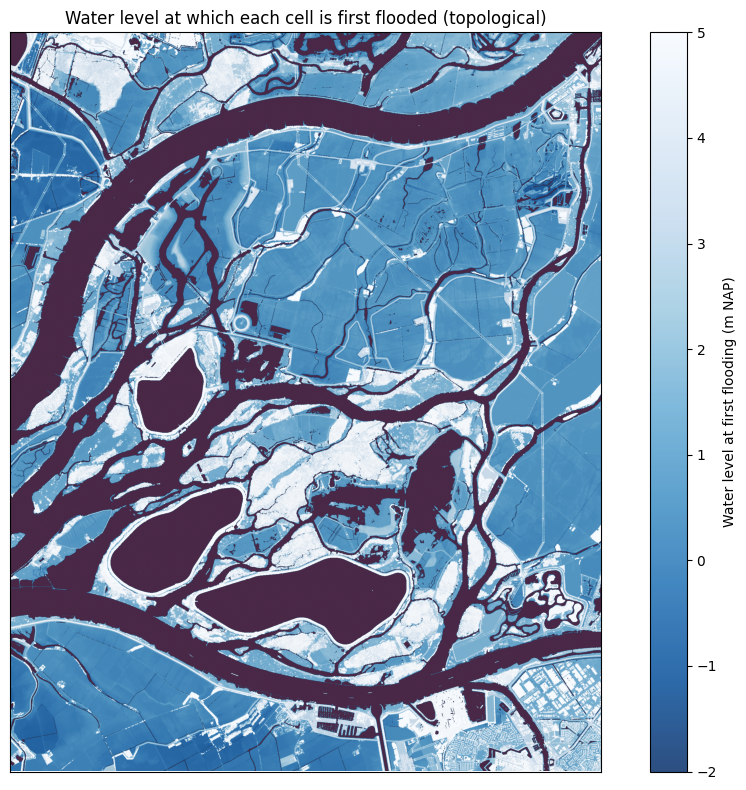

In [24]:
#visualization of the water level at which each cell is first flooded (topological).
fig, ax = plt.subplots(figsize=(10, 8))

# background terrain
ax.imshow(crop, cmap='Greys_r', vmin=vmin_crop, vmax=vmax_crop, alpha=0.4)

# flood level map: show only real terrain elevations, exclude barrier pixels
display_map = np.where(
    np.isfinite(flood_level_map) & (flood_level_map < barrier_value),
    flood_level_map,
    np.nan
)
im = ax.imshow(display_map, cmap='Blues_r', vmin=-2, vmax=5, alpha=0.85)
plt.colorbar(im, ax=ax, label='Water level at first flooding (m NAP)')

# river seed pixels
seed_overlay = np.where(seed_mask_water, 1.0, np.nan)
ax.imshow(seed_overlay, cmap='Reds', vmin=0, vmax=1, alpha=0.5)

ax.set_title('Water level at which each cell is first flooded (topological)')
ax.set_xticks([])
ax.set_yticks([])
plt.tight_layout()
plt.show()

## Comparison: threshold vs topological flood model (RQ1)

### RQ1 — Threshold vs topological comparison
Compares two flood models at identical water levels, land pixels only.
Simple threshold: all pixels with elevation <= water_level are flooded.
Topological: only pixels reachable from the river via connected terrain.
Difference = threshold false positives (isolated depressions behind barriers).

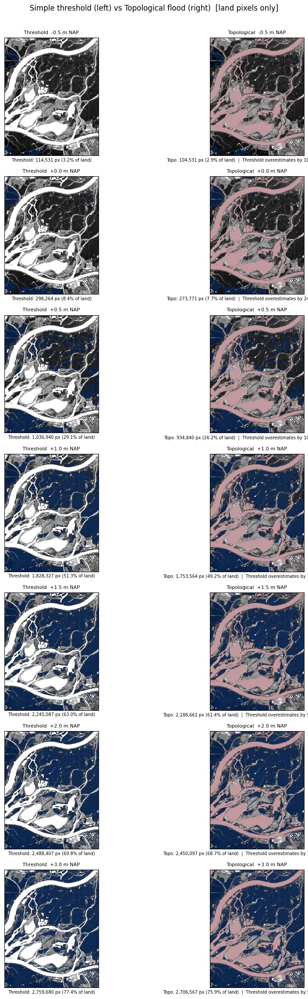

In [25]:
#side by side snapshots of simple threshold vs topological flood at seven water levels.
# Comparison is over land pixels only (where original crop has valid elevation).
# Excluding seed/water pixels removes the constant 28.72 pp offset.
wl_list   = [-0.5, 0.0, 0.5, 1.0, 1.5, 2.0, 3.0]
land_mask = np.isfinite(crop)          # True for terrestrial pixels, False for water bodies
n_land    = int(land_mask.sum())

fig, axes = plt.subplots(len(wl_list), 2, figsize=(12, len(wl_list) * 3.2))
fig.suptitle("Simple threshold (left) vs Topological flood (right)  [land pixels only]",
             fontsize=12, y=1.005)

for row, wl in enumerate(wl_list):
    simple_flood = (crop_tda <= wl) & land_mask
    topo_flood   = (flood_level_map <= wl) & land_mask

    n_s = int(simple_flood.sum())
    n_t = int(topo_flood.sum())
    fp  = n_s - n_t

    for col, (flood, label) in enumerate([
        (simple_flood, f"Threshold  {wl:+.1f} m NAP"),
        (topo_flood,   f"Topological  {wl:+.1f} m NAP"),
    ]):
        ax = axes[row, col]
        ax.imshow(crop, cmap="Greys_r", vmin=vmin_crop, vmax=vmax_crop)
        ax.imshow(np.where(flood, 1.0, np.nan), cmap="Blues", vmin=0, vmax=1, alpha=0.7)
        if col == 1:
            ax.imshow(np.where(seed_mask_water, 1.0, np.nan), cmap="Reds", vmin=0, vmax=1, alpha=0.4)
        ax.set_title(label, fontsize=8)
        ax.set_xticks([])
        ax.set_yticks([])

    axes[row, 0].set_xlabel(f"Threshold: {n_s:,} px ({100*n_s/n_land:.1f}% of land)", fontsize=7)
    axes[row, 1].set_xlabel(
        f"Topo: {n_t:,} px ({100*n_t/n_land:.1f}% of land)  |  "
        f"Threshold overestimates by {fp:,} px ({100*fp/n_land:+.1f} pp)",
        fontsize=7
    )

plt.tight_layout()
plt.show()

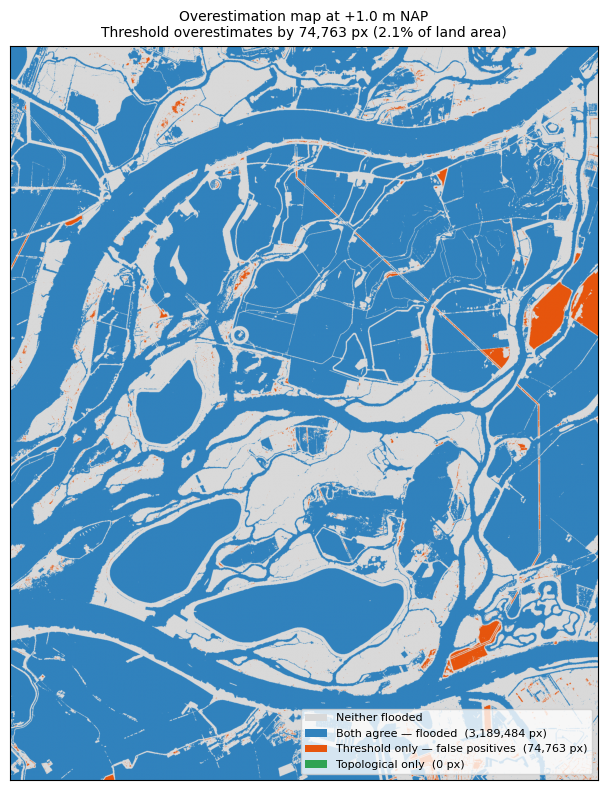

In [26]:
#overestimation map: where does the threshold model flood cells that are not reachable from the river?
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Patch

repr_wl = 1.0   # change to explore — try 0.5, 1.0, 1.5

land_mask     = np.isfinite(crop)
valid_terrain = land_mask & ~seed_mask_water

simple_flood_r = (crop_tda <= repr_wl) & land_mask
topo_flood_r   = (flood_level_map <= repr_wl) & land_mask

# 4-category map on land pixels; water bodies shown as always-flooded (blue).
category = np.zeros(crop.shape, dtype=int)
category[seed_mask_water] = 1
category[valid_terrain & simple_flood_r & topo_flood_r]  = 1   # both agree
category[valid_terrain & simple_flood_r & ~topo_flood_r] = 2   # threshold only (false positive)
category[valid_terrain & ~simple_flood_r & topo_flood_r] = 3   # topo only

cmap4 = ListedColormap(["#d9d9d9", "#3182bd", "#e6550d", "#31a354"])
norm4 = BoundaryNorm([0, 1, 2, 3, 4], ncolors=4)

fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(category, cmap=cmap4, norm=norm4)

n_land = int(land_mask.sum())
n_both = int((category == 1).sum())
n_fp   = int((category == 2).sum())
n_tp   = int((category == 3).sum())

ax.legend(handles=[
    Patch(facecolor="#d9d9d9", label="Neither flooded"),
    Patch(facecolor="#3182bd", label=f"Both agree — flooded  ({n_both:,} px)"),
    Patch(facecolor="#e6550d", label=f"Threshold only — false positives  ({n_fp:,} px)"),
    Patch(facecolor="#31a354", label=f"Topological only  ({n_tp:,} px)"),
], loc="lower right", fontsize=8)

ax.set_title(
    f"Overestimation map at {repr_wl:+.1f} m NAP\n"
    f"Threshold overestimates by {n_fp:,} px ({100*n_fp/n_land:.1f}% of land area)",
    fontsize=10
)
ax.set_xticks([])
ax.set_yticks([])
plt.tight_layout()
plt.show()

In [27]:
#quantitative comparison table: threshold vs topological flood extent, land pixels only.
wl_table  = [-1.0, 0.0, 0.5, 1.0, 1.5, 2.0, 3.0, 5.0]
land_mask = np.isfinite(crop)
n_land    = int(land_mask.sum())

print(f"Land pixels: {n_land:,}  (water/NaN excluded from both models)\n")
print(f"{'Water level (m NAP)':>20} | {'Threshold (%)':>14} | {'Topo (%)':>10} | {'Difference (pp)':>16}")
print("-" * 70)
for wl in wl_table:
    n_s   = int(((crop_tda <= wl) & land_mask).sum())
    n_t   = int(((flood_level_map <= wl) & land_mask).sum())
    pct_s = 100 * n_s / n_land
    pct_t = 100 * n_t / n_land
    print(f"{wl:>20.1f} | {pct_s:>14.2f} | {pct_t:>10.2f} | {pct_s - pct_t:>+16.2f}")

Land pixels: 3,564,080  (water/NaN excluded from both models)

 Water level (m NAP) |  Threshold (%) |   Topo (%) |  Difference (pp)
----------------------------------------------------------------------
                -1.0 |           0.22 |       0.16 |            +0.07
                 0.0 |           8.37 |       7.68 |            +0.69
                 0.5 |          29.09 |      26.23 |            +2.86
                 1.0 |          51.30 |      49.20 |            +2.10
                 1.5 |          62.99 |      61.41 |            +1.58
                 2.0 |          69.82 |      68.74 |            +1.07
                 3.0 |          77.43 |      75.94 |            +1.49
                 5.0 |          87.31 |      86.85 |            +0.46


## RQ2 — Which basins connect to the river first?

Replays the saddle events from the flood simulation in chronological order to identify which isolated basins first become connected to the main river component, and at what water level. Only basins >= 1000 pixels (~25,000 m² at 5m resolution) are shown to exclude tidal-margin artefacts.

In [28]:
#RQ2: which isolated basins first connect to the main river system, and at what water level?
# Filters applied:
#   min_basin_px  -- ignore tiny tidal-margin artefacts (< 1000 px = < 25 km2 at 5 m resolution)
#   max_saddle_wl -- ignore connections at unrealistically high water levels (barrier artefacts)
min_basin_px  = 1000
max_saddle_wl = barrier_value   # saddle events at or above the barrier value are artefacts

if not saddle_events:
    print("No saddle events — all seed pixels form one connected component.")
else:
    # Identify main river component: seed label covering the most pixels.
    label_seed_counts = {}
    for r, c in np.argwhere(seed_mask_water):
        lbl = int(flood_labels[r, c])
        label_seed_counts[lbl] = label_seed_counts.get(lbl, 0) + 1
    main_label = max(label_seed_counts, key=label_seed_counts.get)
    print(f"Main river component: label {main_label}  ({label_seed_counts[main_label]:,} seed pixels)\n")

    # Replay union-find chronologically.
    max_lbl = int(flood_labels[flood_labels >= 0].max()) if (flood_labels >= 0).any() else 0
    pr = list(range(max_lbl + 1))

    def _find(x):
        while pr[x] != x:
            pr[x] = pr[pr[x]]
            x = pr[x]
        return x

    connections = []
    for elev, la, lb in sorted(saddle_events):
        if elev >= max_saddle_wl:
            continue                       # skip barrier-wall artefacts
        pa, pb = _find(la), _find(lb)
        if pa == pb:
            continue
        river = _find(main_label)
        if pa == river:
            connections.append((elev, lb))
            pr[pb] = pa
        elif pb == river:
            connections.append((elev, la))
            pr[pa] = pb
        else:
            pr[pb] = pa

    # Filter: keep only basins large enough to be hydrologically meaningful.
    significant = []
    for elev, lbl in connections:
        px = np.argwhere(flood_labels == lbl)
        if len(px) >= min_basin_px:
            significant.append((elev, lbl, px))

    print(f"Total connections to river: {len(connections)}")
    print(f"After size filter (>= {min_basin_px:,} px): {len(significant)}\n")

    if not significant:
        print("No significant basins found — try reducing min_basin_px.")
    else:
        print(f"{'Rank':>4}  {'Water level (m NAP)':>20}  {'Label':>7}  "
              f"{'Centroid (row, col)':>22}  {'Basin pixels':>13}")
        print("-" * 75)
        for rank, (elev, lbl, px) in enumerate(significant, 1):
            cr = int(px[:, 0].mean())
            cc = int(px[:, 1].mean())
            print(f"{rank:>4}  {elev:>20.3f}  {lbl:>7}  "
                  f"({cr:>5}, {cc:>5})              {len(px):>13,}")

Main river component: label 755  (671,612 seed pixels)

Total connections to river: 803
After size filter (>= 1,000 px): 171

Rank   Water level (m NAP)    Label     Centroid (row, col)   Basin pixels
---------------------------------------------------------------------------
   1                 0.258     4200  ( 1424,   532)                      1,760
   2                 0.366     3435  ( 1483,   626)                      1,461
   3                 0.413     4179  ( 1489,   528)                      1,318
   4                 0.470     3892  ( 1523,   445)                      5,008
   5                 0.606     3455  ( 1507,   460)                      1,515
   6                 0.641     3420  ( 1543,   571)                      9,756
   7                 0.783     3537  ( 1642,   950)                      1,485
   8                 0.798     4260  ( 1616,  1005)                      1,279
   9                 0.808     3572  ( 1537,   778)                      8,006
  10        

## Merge tree visualization (RQ3 + RQ4)

### RQ3 + RQ4 — Merge tree visualization and saddle point map
The persistence barcode shows the top-N most persistent basins as
horizontal bars: left endpoint = basin birth (minimum elevation),
right endpoint = merge elevation (saddle height, i.e. the water level
at which this basin connects to a lower one). This directly answers RQ3.
The saddle point map overlays basin minima and saddle locations on the
terrain, revealing barriers and corridors invisible in raw elevation (RQ4).

Showing 40 most persistent merges within 0-5.0 m NAP
Merge elevation range: 2.609 -- 4.982 m
Persistence range:     4.398 -- 5.926 m


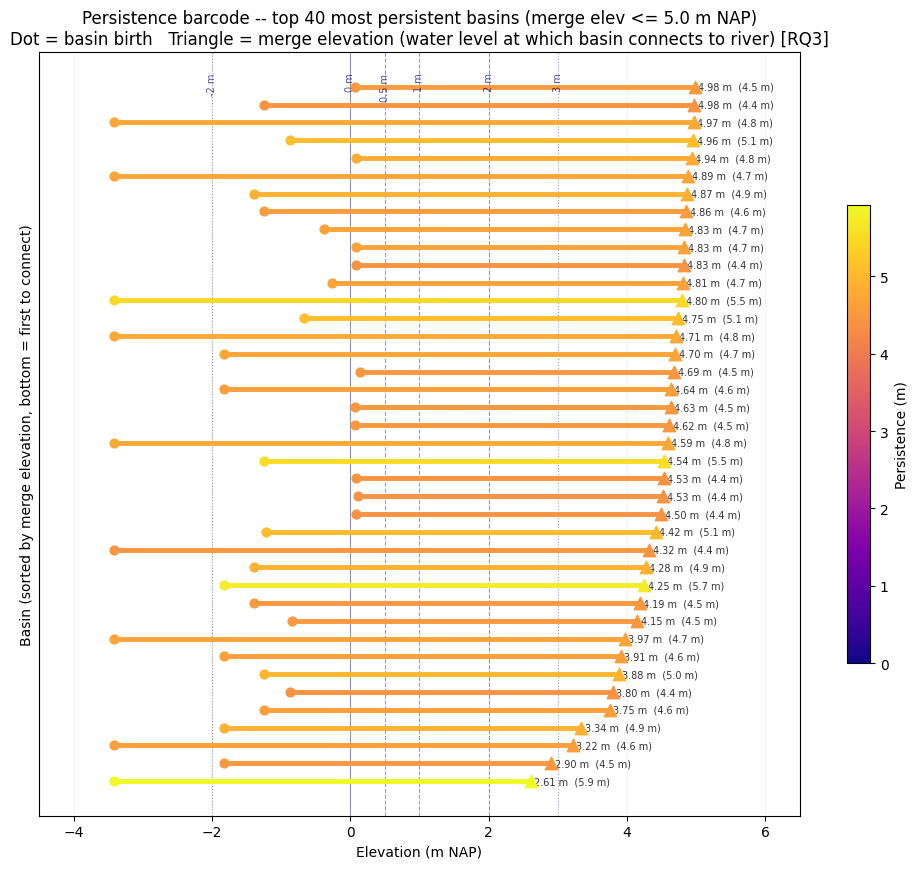

In [29]:
#persistence barcode: each bar = one basin, from birth elevation to merge elevation (RQ3).
# Replaces the networkx dendrogram which cannot handle the number of basins in this dataset.
# Top-N by persistence within the flood-relevant range -- readable at any N.
top_n          = 40     # number of basins to show
max_merge_elev = 5.0    # cap at flood simulation ceiling
min_pers_bar   = 0.5    # floor to exclude LiDAR noise

candidates = sorted(
    [(se, ba, bb, se - max(ba, bb))
     for se, ba, bb in valid_merges
     if se - max(ba, bb) >= min_pers_bar and se <= max_merge_elev],
    key=lambda x: x[3], reverse=True
)[:top_n]

bars = sorted(candidates, key=lambda x: x[0])
print(f"Showing {len(bars)} most persistent merges within 0-{max_merge_elev} m NAP")
print(f"Merge elevation range: {bars[0][0]:.3f} -- {bars[-1][0]:.3f} m")
print(f"Persistence range:     {min(x[3] for x in bars):.3f} -- {max(x[3] for x in bars):.3f} m")

norm_p = plt.Normalize(vmin=0, vmax=max(x[3] for x in bars))
cmap_p = plt.cm.plasma

fig, ax = plt.subplots(figsize=(10, max(5, len(bars) * 0.22)))

for i, (se, ba, bb, pers) in enumerate(bars):
    elder_birth = min(ba, bb)
    color = cmap_p(norm_p(pers))
    ax.plot([elder_birth, se], [i, i], lw=3.5, color=color, solid_capstyle='round', zorder=3)
    ax.scatter([elder_birth], [i], color=color, s=40, zorder=4)
    ax.scatter([se], [i], color=color, s=80, marker='^', zorder=4)
    ax.text(se + 0.05, i, f'{se:.2f} m  ({pers:.1f} m)', fontsize=7, va='center', color='#333333')

for level, ls, label in [(-2.0, ':', '-2'), (0.0, '-', '0'),
                          (0.5, '--', '0.5'), (1.0, '--', '1'),
                          (2.0, '--', '2'), (3.0, ':', '3')]:
    ax.axvline(level, color='navy', lw=0.8, ls=ls, alpha=0.4)
    ax.text(level, len(bars) - 0.2, f'{label} m', fontsize=7,
            color='navy', ha='center', rotation=90, va='top', alpha=0.7)

sm = plt.cm.ScalarMappable(cmap=cmap_p, norm=norm_p)
sm.set_array([])
plt.colorbar(sm, ax=ax, label='Persistence (m)', shrink=0.6)

ax.set_xlabel('Elevation (m NAP)')
ax.set_ylabel('Basin (sorted by merge elevation, bottom = first to connect)')
ax.set_xlim(-4.5, max_merge_elev + 1.5)
ax.set_yticks([])
ax.xaxis.grid(True, alpha=0.15)
ax.set_title(
    f'Persistence barcode -- top {len(bars)} most persistent basins (merge elev <= {max_merge_elev} m NAP)\n'
    'Dot = basin birth   Triangle = merge elevation (water level at which basin connects to river) [RQ3]'
)
plt.tight_layout()
plt.show()

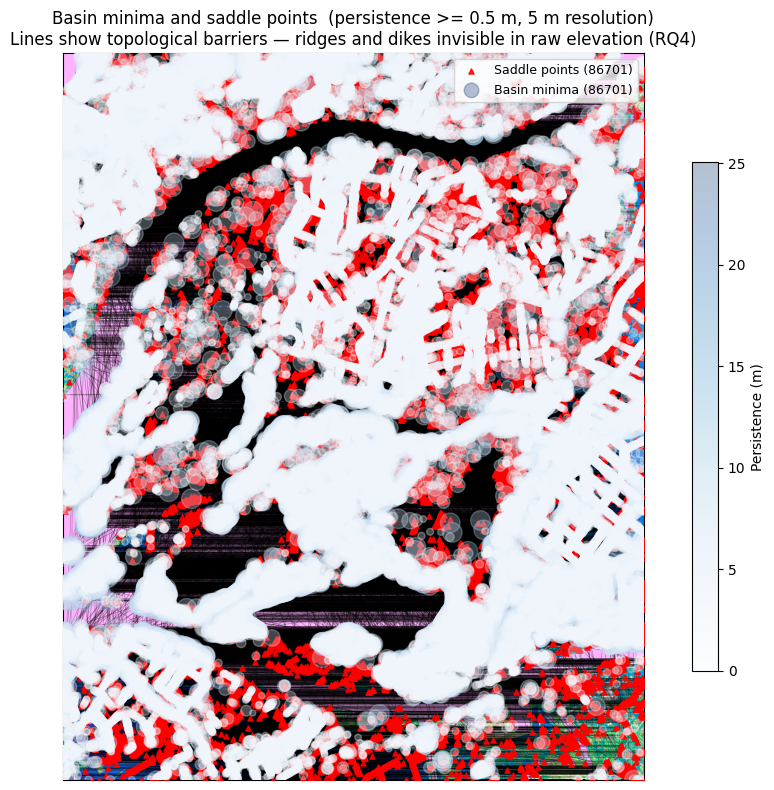

In [30]:
#saddle point map: basin minima (blue) connected to their saddles (red) by thin lines (RQ4).
# Uses GUDHI full-resolution data (5 m resolution).
basin_arr  = np.array(basin_locations)
saddle_arr = np.array(saddle_locations)
pers_plot  = np.array([d - b for b, d in filtered_pairs])

fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(crop, cmap='terrain', vmin=vmin_crop, vmax=vmax_crop)

# thin lines connecting each basin minimum to its saddle point
for (br, bc), (sr, sc) in zip(basin_locations, saddle_locations):
    ax.plot([bc, sc], [br, sr], 'k-', linewidth=0.5, alpha=0.3)

# river seed pixels
ax.imshow(np.where(seed_mask_water, 1.0, np.nan), cmap='cool', vmin=0, vmax=1, alpha=0.3)

# saddle points
ax.scatter(saddle_arr[:, 1], saddle_arr[:, 0],
           c='red', s=14, marker='^', alpha=0.85, zorder=4,
           label=f'Saddle points ({len(saddle_arr)})')

# basin minima: colour and size by persistence
sizes = np.clip(pers_plot * 40, 8, 200)
sc = ax.scatter(basin_arr[:, 1], basin_arr[:, 0],
                c=pers_plot, cmap='Blues', vmin=0, s=sizes,
                alpha=0.3, zorder=5, label=f'Basin minima ({len(basin_arr)})')
plt.colorbar(sc, ax=ax, label='Persistence (m)', shrink=0.7)

ax.legend(fontsize=9, loc='upper right')
ax.set_title(
    f'Basin minima and saddle points  (persistence >= {persistence_threshold} m, 5 m resolution)\n'
    'Lines show topological barriers — ridges and dikes invisible in raw elevation (RQ4)'
)
ax.set_xticks([])
ax.set_yticks([])
plt.tight_layout()
plt.show()

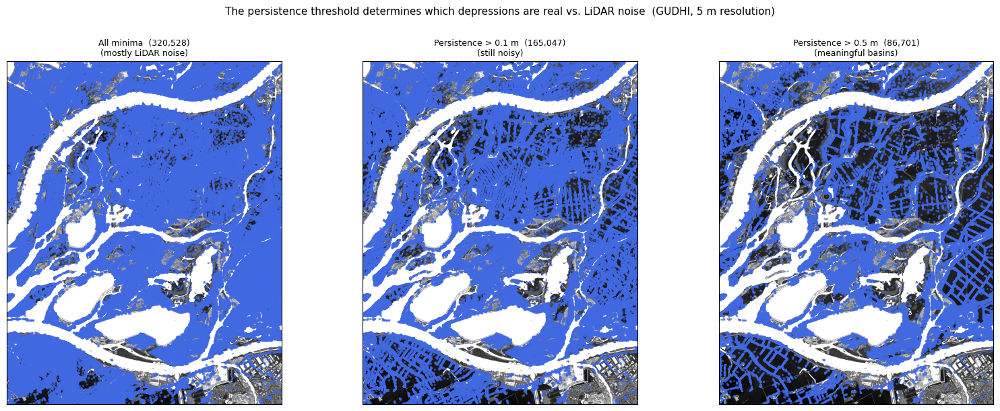

In [31]:
#persistence threshold comparison: the threshold separates LiDAR noise from real basins.
# Pre-build a birth_val -> pixel lookup so we only scan crop_tda.flatten() once.
_flat = crop_tda.flatten()
_birth_px = {}
for _b, _d in h0_pairs:
    if _b not in _birth_px:
        _m = np.where(_flat == _b)[0]
        _birth_px[_b] = np.unravel_index(int(_m[0]) if len(_m) else int(np.argmin(np.abs(_flat - _b))),
                                          crop_tda.shape)

def _basin_locs(t):
    arr = np.array([_birth_px[b] for b, d in h0_pairs if (d - b) >= t])
    return arr if len(arr) else np.empty((0, 2), dtype=int)

thresholds_cmp = [0.0, 0.1, 0.5]
locs_cmp = [_basin_locs(t) for t in thresholds_cmp]
subtitles = [
    f"All minima  ({len(locs_cmp[0]):,})\n(mostly LiDAR noise)",
    f"Persistence > 0.1 m  ({len(locs_cmp[1]):,})\n(still noisy)",
    f"Persistence > 0.5 m  ({len(locs_cmp[2]):,})\n(meaningful basins)",
]

fig, axes = plt.subplots(1, 3, figsize=(16, 6))
for ax, loc, sub in zip(axes, locs_cmp, subtitles):
    ax.imshow(crop, cmap='Greys_r', vmin=vmin_crop, vmax=vmax_crop)
    if len(loc):
        ax.scatter(loc[:, 1], loc[:, 0], c='royalblue', s=2, alpha=0.5)
    ax.set_title(sub, fontsize=9)
    ax.set_xticks([])
    ax.set_yticks([])

fig.suptitle(
    'The persistence threshold determines which depressions are real vs. LiDAR noise'
    '  (GUDHI, 5 m resolution)',
    fontsize=11, y=1.01
)
plt.tight_layout()
plt.show()

In [32]:
#critical elevation table: merge events sorted by saddle elevation (RQ3).
# These are the water levels at which topologically distinct basins first connect.
min_pers_table = 0.5

sig_table = sorted(
    [(se, ba, bb, se - max(ba, bb))
     for se, ba, bb in valid_merges
     if se - max(ba, bb) >= min_pers_table],
    key=lambda x: x[0]   # sort by merge elevation
)

print(f"Critical merge events  (persistence >= {min_pers_table} m, 20 m resolution): {len(sig_table)}\n")
print(f"{'Rank':>4}  {'Merge elev (m NAP)':>18}  {'Basin A birth (m)':>18}  "
      f"{'Basin B birth (m)':>18}  {'Persistence (m)':>16}")
print("-" * 82)
for rank, (se, ba, bb, pers) in enumerate(sig_table, 1):
    print(f"{rank:>4}  {se:>18.3f}  {ba:>18.3f}  {bb:>18.3f}  {pers:>16.3f}")

Critical merge events  (persistence >= 0.5 m, 20 m resolution): 43725

Rank  Merge elev (m NAP)   Basin A birth (m)   Basin B birth (m)   Persistence (m)
----------------------------------------------------------------------------------
   1              -2.617              -3.317              -3.261             0.645
   2              -2.592              -3.229              -3.285             0.638
   3              -2.201              -3.424              -2.818             0.617
   4              -1.941              -3.027              -3.285             1.086
   5              -1.720              -3.424              -3.285             1.566
   6              -1.244              -1.823              -1.763             0.519
   7              -1.173              -1.763              -1.955             0.591
   8              -1.083              -1.720              -1.726             0.637
   9              -1.050              -1.596              -1.595             0.545
  10            

## Flood animation

In [33]:
#setup for flood animation: downsample, build component colour lookup.
from matplotlib.animation import FuncAnimation

ds = 2   # downsample factor for animation performance (2 = 1250x1000 from 2500x2000)
crop_anim     = crop[::ds, ::ds]
crop_tda_anim = crop_tda[::ds, ::ds]
seed_anim     = seed_mask_water[::ds, ::ds]
land_anim     = np.isfinite(crop_anim)
n_land_anim   = int(land_anim.sum())
vmin_a, vmax_a = vmin_crop, vmax_crop

wl_sorted = sorted(snapshots.keys())
print(f"Snapshots: {len(wl_sorted)}  ({wl_sorted[0]:.2f} to {wl_sorted[-1]:.2f} m NAP)")
print(f"Animation grid: {crop_anim.shape} ({crop_anim.size:,} pixels after {ds}x downsample)")

# Collect all component labels that ever appear and assign a colour each.
# tab20 gives 20 distinct hues; wrap modulo so extra labels still get a colour.
all_labels = set()
for arr in snapshots.values():
    ds_arr = arr[::ds, ::ds]
    all_labels.update(int(l) for l in np.unique(ds_arr) if l >= 0)
all_labels = sorted(all_labels)
print(f"Component labels: {all_labels}")

cmap_comp  = plt.cm.get_cmap('tab20', 20)
max_lbl    = max(all_labels) if all_labels else 0
# colour_lut[label] = (R, G, B, A)
colour_lut = np.array([cmap_comp(lbl % 20) for lbl in range(max_lbl + 1)])

def make_rgba(labels_ds):
    """Convert a downsampled labels array to an RGBA image."""
    rgba = np.zeros((*labels_ds.shape, 4), dtype=float)
    flooded = labels_ds >= 0
    if flooded.any():
        idx = np.clip(labels_ds[flooded].astype(int), 0, max_lbl)
        rgba[flooded] = colour_lut[idx]
    return rgba

# Precompute seed overlay (constant across frames)
seed_overlay_anim = np.where(seed_anim, 1.0, np.nan)

Snapshots: 60  (-2.00 to 5.00 m NAP)
Animation grid: (1250, 1000) (1,250,000 pixels after 2x downsample)
Component labels: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 26, 29, 30, 32, 33, 34, 36, 37, 38, 39, 40, 41, 43, 44, 45, 46, 47, 49, 50, 51, 52, 53, 54, 55, 56, 57, 60, 61, 62, 63, 64, 65, 66, 67, 68, 70, 71, 73, 74, 75, 77, 78, 79, 80, 81, 82, 83, 84, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 97, 98, 99, 100, 101, 103, 105, 107, 108, 109, 110, 112, 114, 116, 117, 118, 119, 120, 121, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 134, 135, 136, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 152, 153, 154, 155, 156, 159, 160, 161, 162, 164, 165, 166, 167, 168, 169, 170, 172, 173, 174, 175, 176, 177, 179, 180, 181, 182, 183, 184, 185, 186, 187, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 201, 202, 204, 205, 206, 207, 208, 209, 210, 211, 214, 216, 217, 218, 219, 220, 221, 222, 224, 225, 226, 227, 228, 229, 23

C:\Users\danie\AppData\Local\Temp\ipykernel_20164\3954696332.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_comp  = plt.cm.get_cmap('tab20', 20)


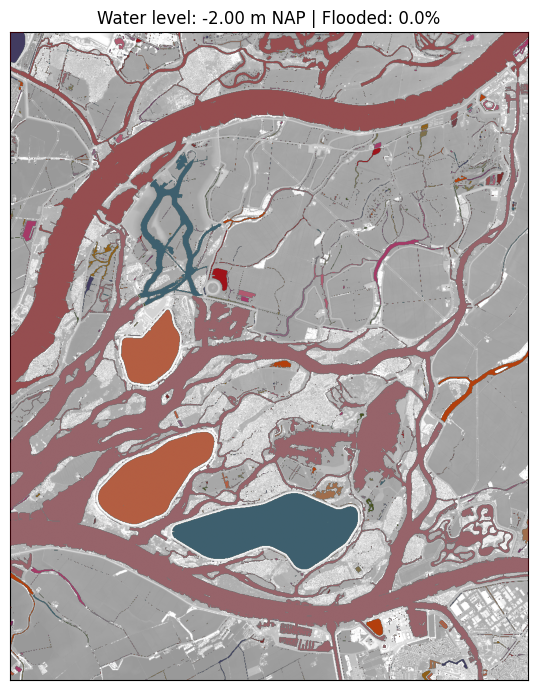

MovieWriter ffmpeg unavailable; using Pillow instead.


Saved flood_animation.gif
MP4 skipped (ffmpeg unavailable): unknown file extension: .mp4


In [34]:
#topological flood animation: components coloured by label, seeds in red.
fig, ax = plt.subplots(figsize=(9, 7))
ax.imshow(crop_anim, cmap='Greys_r', vmin=vmin_a, vmax=vmax_a, alpha=0.4, zorder=1)
flood_im = ax.imshow(make_rgba(np.full(crop_anim.shape, -1, dtype=int)), zorder=2)
ax.imshow(seed_overlay_anim, cmap='Reds', vmin=0, vmax=1, alpha=0.5, zorder=3)
ax.set_xticks([]); ax.set_yticks([])
title = ax.set_title('')

def _update_topo(i):
    wl      = wl_sorted[i]
    lab_ds  = snapshots[wl][::ds, ::ds]
    flood_im.set_data(make_rgba(lab_ds))
    pct = 100 * (lab_ds[land_anim] >= 0).sum() / n_land_anim
    title.set_text(f'Water level: {wl:.2f} m NAP | Flooded: {pct:.1f}%')
    return flood_im, title

anim_topo = FuncAnimation(fig, _update_topo, frames=len(wl_sorted), interval=150, blit=True)
plt.tight_layout()
plt.show()

anim_topo.save('flood_animation.gif', writer='pillow', fps=7, dpi=100)
print('Saved flood_animation.gif')
try:
    anim_topo.save('flood_animation.mp4', writer='ffmpeg', fps=10, dpi=120)
    print('Saved flood_animation.mp4')
except Exception as e:
    print(f'MP4 skipped (ffmpeg unavailable): {e}')

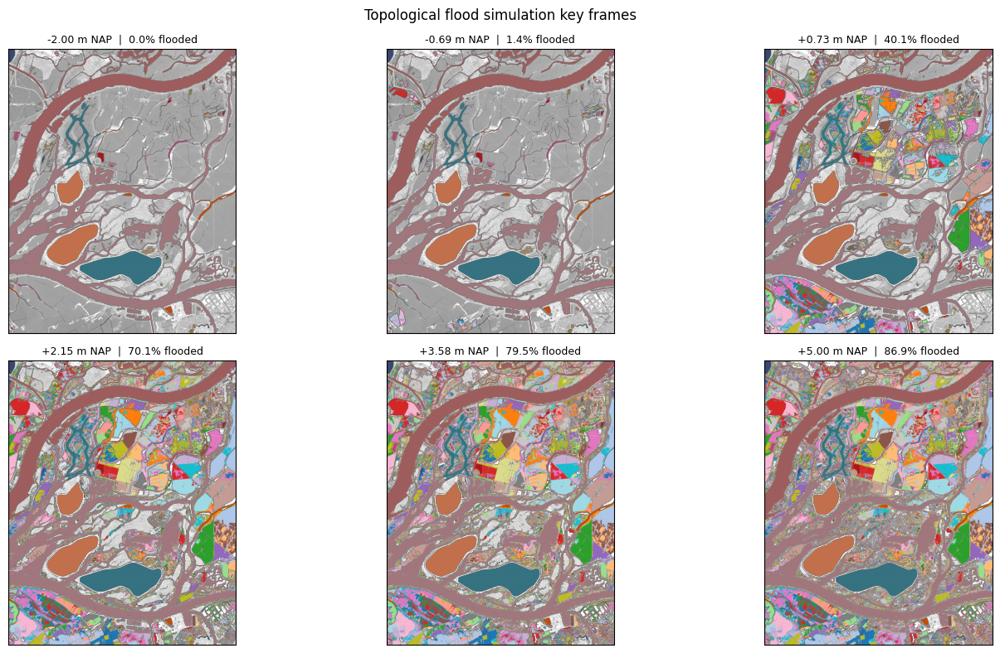

Saved flood_keyframes.png


In [35]:
#key-frame figure: 6 evenly-spaced snapshots as a 2x3 grid for the report.
frame_idx = np.linspace(0, len(wl_sorted) - 1, 6, dtype=int)

fig, axes = plt.subplots(2, 3, figsize=(15, 8))
for ax, i in zip(axes.flat, frame_idx):
    wl     = wl_sorted[i]
    lab_ds = snapshots[wl][::ds, ::ds]
    rgba   = make_rgba(lab_ds)
    pct    = 100 * (lab_ds[land_anim] >= 0).sum() / n_land_anim

    ax.imshow(crop_anim, cmap='Greys_r', vmin=vmin_a, vmax=vmax_a, alpha=0.4)
    ax.imshow(rgba)
    ax.imshow(seed_overlay_anim, cmap='Reds', vmin=0, vmax=1, alpha=0.4)
    ax.set_title(f'{wl:+.2f} m NAP  |  {pct:.1f}% flooded', fontsize=9)
    ax.set_xticks([]); ax.set_yticks([])

fig.suptitle('Topological flood simulation key frames', fontsize=12)
plt.tight_layout()
plt.savefig('flood_keyframes.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved flood_keyframes.png')

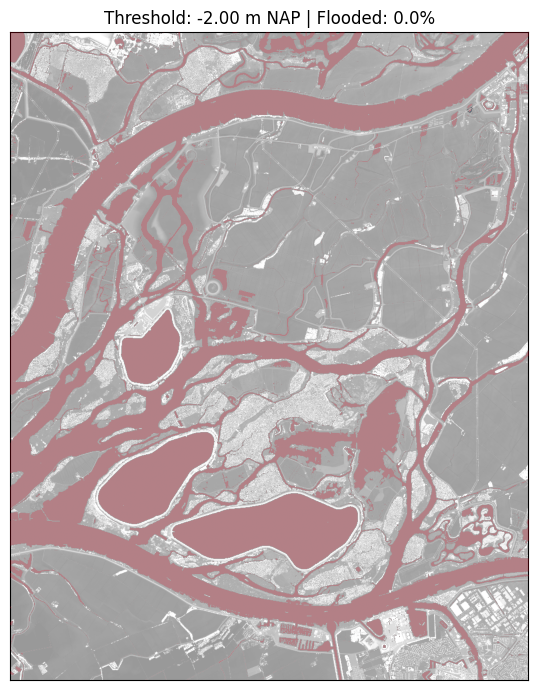

Saved flood_threshold_animation.gif


In [36]:
#simple threshold animation: single blue colour, no connectivity, for RQ1 contrast.
fig2, ax2 = plt.subplots(figsize=(9, 7))
ax2.imshow(crop_anim, cmap='Greys_r', vmin=vmin_a, vmax=vmax_a, alpha=0.4, zorder=1)
thresh_im  = ax2.imshow(np.zeros((*crop_anim.shape, 4)), zorder=2)
ax2.imshow(seed_overlay_anim, cmap='Reds', vmin=0, vmax=1, alpha=0.5, zorder=3)
ax2.set_xticks([]); ax2.set_yticks([])
title2 = ax2.set_title('')

_BLUE = np.array([0.18, 0.44, 0.71, 0.82])   # single colour for all flooded cells

def _update_thresh(i):
    wl    = wl_sorted[i]
    flood = (crop_tda_anim <= wl) & land_anim
    rgba  = np.zeros((*crop_anim.shape, 4))
    rgba[flood] = _BLUE
    thresh_im.set_data(rgba)
    pct = 100 * flood.sum() / n_land_anim
    title2.set_text(f'Threshold: {wl:.2f} m NAP | Flooded: {pct:.1f}%')
    return thresh_im, title2

anim_thresh = FuncAnimation(fig2, _update_thresh, frames=len(wl_sorted), interval=150, blit=True)
plt.tight_layout()
plt.show()

anim_thresh.save('flood_threshold_animation.gif', writer='pillow', fps=7, dpi=100)
print('Saved flood_threshold_animation.gif')

## Results audit

In [37]:
import numpy as np

_SEP = "-" * 65
_pixel_m = 5.0
_pixel_area_km2 = (_pixel_m ** 2) / 1e6

# -- 1. DATASET
print(_SEP)
_land_mask   = np.isfinite(crop)
_n_land      = int(_land_mask.sum())
_n_water     = int(nan_mask.sum())
_n_seed_full = int(seed_mask_full.sum())
_n_seed_w    = int(seed_mask_water.sum())
_total       = crop.size
_area_km2    = _total * _pixel_area_km2
print(f"crop shape        : {crop.shape}  |  {_pixel_m:.0f} m pixels  |  {_area_km2:.2f} km²")
print(f"elevation (m NAP) : min={np.nanmin(crop):.4f}  max={np.nanmax(crop):.4f}  mean={np.nanmean(crop):.4f}")
print(f"seed_mask_water   : {_n_seed_w:,}  ({100*_n_seed_w/_total:.2f}%)")
print(f"seed_mask_full    : {_n_seed_full:,}  ({100*_n_seed_full/_total:.2f}%)")
print(f"land pixels       : {_n_land:,}")
print(f"barrier value     : {barrier_value:.4f} m")

# -- 5. GUDHI
print(_SEP)
print(f"GUDHI H0 finite pairs : {len(h0_pairs):,}")
print(f"Barrier pairs         : {n_barrier:,}")
print(f"Persistence stats     : min={gudhi_persistences.min():.4f}  max={gudhi_persistences.max():.4f}  mean={gudhi_persistences.mean():.4f}  median={np.median(gudhi_persistences):.4f}")
for _t in [0.10, 0.25, 0.50, 1.00]:
    _n = int((gudhi_persistences >= _t).sum())
    print(f"  >= {_t:.2f} m : {_n:,} basins")

# -- 6. MERGE TREE SWEEP
print(_SEP)
_me = np.array([se for se, _, _ in valid_merges])
print(f"Sweep grid            : {Z_sweep.shape}  ({_pixel_m:.0f} m res)")
print(f"Local minima (births) : {len(births):,}")
print(f"Total merges          : {len(merges):,}")
print(f"Valid merges (<barrier): {len(valid_merges):,}")
for _p in [10, 25, 50, 75, 90]:
    print(f"  {_p:2d}th pct merge elev : {np.percentile(_me, _p):.4f} m NAP")

# -- 7. FLOOD SIMULATION
print(_SEP)
_total_px  = crop_tda.size
_n_flooded = int(np.isfinite(flood_level_map).sum())
_wl_min, _wl_max = float(min(water_levels_sim)), float(max(water_levels_sim))
print(f"Water levels          : {_wl_min:.2f} to {_wl_max:.2f} m NAP  ({len(water_levels_sim)} steps)")
print(f"Pixels flooded        : {_n_flooded:,} / {_total_px:,}  ({100*_n_flooded/_total_px:.1f}%)")
print(f"Saddle events         : {len(saddle_events):,}")

# -- 8. RQ1
print(_SEP)
print(f"RQ1  | {'WL (m)':>7} | {'Thresh (%)':>11} | {'Topo (%)':>9} | {'Diff (pp)':>10} | {'FP px':>8}")
print(f"     | {'-'*7} | {'-'*11} | {'-'*9} | {'-'*10} | {'-'*8}")
for _wl in [-1.0, 0.0, 0.5, 1.0, 1.5, 2.0, 3.0, 5.0]:
    _ns  = int(((crop_tda <= _wl) & _land_mask).sum())
    _nt  = int(((flood_level_map <= _wl) & _land_mask).sum())
    _ps  = 100 * _ns / _n_land
    _pt  = 100 * _nt / _n_land
    _fp  = _ns - _nt
    print(f"     | {_wl:>7.1f} | {_ps:>11.2f} | {_pt:>9.2f} | {_ps-_pt:>+10.2f} | {_fp:>8,}")

# -- 9. RQ2: TOP 10
print(_SEP)
print(f"RQ2  | {'Rank':>4} | {'WL (m NAP)':>11} | {'Size (px)':>10} | {'km2':>8} | {'Centroid (r,c)':>16}")
print(f"     | {'-'*4} | {'-'*11} | {'-'*10} | {'-'*8} | {'-'*16}")
for _rank, (_elev, _lbl, _px) in enumerate(significant[:10], 1):
    _cr  = int(_px[:, 0].mean())
    _cc  = int(_px[:, 1].mean())
    _km2 = len(_px) * _pixel_area_km2
    print(f"     | {_rank:>4} | {_elev:>11.3f} | {len(_px):>10,} | {_km2:>8.4f} | ({_cr:>5}, {_cc:>5})")

# -- 10. RQ3: TOP 20 BY PERSISTENCE
print(_SEP)
_top20 = sorted(
    [(se, ba, bb, se - max(ba, bb)) for se, ba, bb in valid_merges],
    key=lambda x: x[3], reverse=True)[:20]
print(f"RQ3 top-20 by persistence (of {len(valid_merges):,} valid merges)")
print(f"  {'Rank':>4} | {'Saddle (m)':>10} | {'Basin A (m)':>12} | {'Basin B (m)':>12} | {'Persist (m)':>11}")
print(f"  {'-'*4} | {'-'*10} | {'-'*12} | {'-'*12} | {'-'*11}")
for _rank, (_se, _ba, _bb, _pers) in enumerate(_top20, 1):
    print(f"  {_rank:>4} | {_se:>10.4f} | {_ba:>12.4f} | {_bb:>12.4f} | {_pers:>11.4f}")

print(_SEP)
print("AUDIT COMPLETE")

-----------------------------------------------------------------
crop shape        : (2500, 2000)  |  5 m pixels  |  125.00 km²
elevation (m NAP) : min=-3.4236  max=119.2097  mean=2.0694
seed_mask_water   : 1,435,920  (28.72%)
seed_mask_full    : 1,734,184  (34.68%)
land pixels       : 3,564,080
barrier value     : 120.2097 m
-----------------------------------------------------------------
GUDHI H0 finite pairs : 320,528
Barrier pairs         : 2,437
Persistence stats     : min=0.0000  max=25.0638  mean=0.6383  median=0.1105
  >= 0.10 m : 165,047 basins
  >= 0.25 m : 121,816 basins
  >= 0.50 m : 86,701 basins
  >= 1.00 m : 53,556 basins
-----------------------------------------------------------------
Sweep grid            : (2500, 2000)  (5 m res)
Local minima (births) : 190,334
Total merges          : 190,333
Valid merges (<barrier): 189,700
  10th pct merge elev : 0.0310 m NAP
  25th pct merge elev : 0.4123 m NAP
  50th pct merge elev : 1.1510 m NAP
  75th pct merge elev : 2.6191 